In [22]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import pandas as pd
import os
from astropy.io import fits

In [23]:
full_df = pd.read_csv('final_full_data_centered.csv')
detected_df = pd.read_csv('detected_newrms.csv')

In [24]:
detected_df

,Name,Epoch,RA,Dec,type,redshift,Distance_Mpc,Rest_DeltaT,Peak Luminosity,RMS,Flux_mjy,RMS_mjy,File Path,fits_path,center_lum,Detection
0,ZTF17aaazdba,1,08:13:16.95,+22:38:53.9,TDE,0.02200,94.285714,49.882583,5.020735e+27,2.043337e+27,0.472018,0.192104,final_luminosity_arrays\ZTF17aaazdba_epoch_1_l...,dillon_extracting_files\dillon_fits\ztf_cutout...,1.246972e+27,False
1,ZTF17aaazdba,2,08:13:16.95,+22:38:53.9,TDE,0.02200,94.285714,1002.915851,1.173864e+28,1.394146e+27,1.103592,0.131071,final_luminosity_arrays\ZTF17aaazdba_epoch_2_l...,dillon_extracting_files\dillon_fits\ztf_cutout...,1.023555e+28,True
2,ZTF17aaazdba,3,08:13:16.95,+22:38:53.9,TDE,0.02200,94.285714,1857.123288,7.425113e+27,1.390637e+27,0.698062,0.130741,final_luminosity_arrays\ZTF17aaazdba_epoch_3_l...,dillon_extracting_files\dillon_fits\ztf_cutout...,7.425113e+27,True
3,ZTF18aadmssd,1,06:50:25.81,+43:03:11.6,SN IIn,0.01885,80.785714,100.691957,3.945697e+28,1.183126e+27,5.052860,0.151513,final_luminosity_arrays\ZTF18aadmssd_epoch_1_l...,dillon_extracting_files\dillon_fits\ztf_cutout...,3.945697e+28,True
4,ZTF18aadmssd,2,06:50:25.81,+43:03:11.6,SN IIn,0.01885,80.785714,980.114835,4.479759e+28,9.766168e+26,5.736781,0.125067,final_luminosity_arrays\ZTF18aadmssd_epoch_2_l...,dillon_extracting_files\dillon_fits\ztf_cutout...,4.479759e+28,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
863,ZTF24abgvscf,2,07:57:32.02,+59:05:07.9,SN Ia,0.01894,81.171429,NaN,2.108735e+28,1.434099e+27,2.674843,0.181912,final_luminosity_arrays\ZTF24abgvscf_epoch_2_l...,dillon_extracting_files\dillon_fits\ztf_cutout...,9.337898e+27,True
864,ZTF24abgvscf,3,07:57:32.02,+59:05:07.9,SN Ia,0.01894,81.171429,-570.645750,1.924552e+28,1.275106e+27,2.441215,0.161744,final_luminosity_arrays\ZTF24abgvscf_epoch_3_l...,dillon_extracting_files\dillon_fits\ztf_cutout...,1.284620e+28,True
865,ZTF24abiktwr,1,00:09:11.75,-00:36:50.8,SN Ia,0.07200,308.571429,-2307.179251,3.575738e+29,1.574173e+28,3.138608,0.138175,final_luminosity_arrays\ZTF24abiktwr_epoch_1_l...,dillon_extracting_files\dillon_fits\ztf_cutout...,2.576797e+28,True
866,ZTF24abiktwr,2,00:09:11.75,-00:36:50.8,SN Ia,0.07200,308.571429,-1425.649401,2.768099e+29,2.049191e+28,2.429702,0.179871,final_luminosity_arrays\ZTF24abiktwr_epoch_2_l...,dillon_extracting_files\dillon_fits\ztf_cutout...,6.938510e+28,True


In [25]:
BOX13_Y0, BOX13_Y1 = 8, 21
BOX13_X0, BOX13_X1 = 8, 21

# Center 3x3 corresponding to the center of the 13x13 crop
BOX3_Y0, BOX3_Y1 = 13, 16
BOX3_X0, BOX3_X1 = 13, 16


def crop_13x13_from_31(arr):
    """
    Use the empirically matched 13x13 crop from the 31x31 FITS image.
    """
    arr = np.asarray(arr, dtype=float)
    return arr[BOX13_Y0:BOX13_Y1, BOX13_X0:BOX13_X1]


def search_13x13_mask_31(arr):
    """
    Mask for the matched 13x13 region in the 31x31 image.
    """
    mask = np.zeros(arr.shape, dtype=bool)
    mask[BOX13_Y0:BOX13_Y1, BOX13_X0:BOX13_X1] = True
    return mask


def central_3x3_mask_31(arr):
    """
    Mask for the center 3x3 corresponding to the matched 13x13 crop.
    """
    mask = np.zeros(arr.shape, dtype=bool)
    mask[BOX3_Y0:BOX3_Y1, BOX3_X0:BOX3_X1] = True
    return mask


def central_3x3_max_31(arr):
    """
    Max in the center 3x3 of the full 31x31 image.
    """
    arr = np.asarray(arr, dtype=float)
    return np.nanmax(arr[BOX3_Y0:BOX3_Y1, BOX3_X0:BOX3_X1])


def central_3x3_max_13(arr):
    """
    Max in the center 3x3 of a 13x13 image.
    """
    arr = np.asarray(arr, dtype=float)
    return np.nanmax(arr[5:8, 5:8])

In [5]:
def calculate_rms(arr, sig_value=4, n_iter=4):
    """
    Iterative sigma-clipped RMS.

    Starts with all finite pixels, then repeatedly removes pixels
    farther than sig_value * std from the median.
    """
    arr = np.asarray(arr, dtype=float)

    mask = np.isfinite(arr)

    for _ in range(n_iter):
        data = arr[mask]

        if len(data) == 0:
            return np.nan

        median = np.nanmedian(data)
        std = np.nanstd(data)

        if not np.isfinite(std) or std == 0:
            return np.nan

        mask = (
            np.isfinite(arr)
            & (np.abs(arr - median) <= sig_value * std)
        )

    return np.nanstd(arr[mask])

In [6]:
def calculate_luminosity(flux, redshift):
    """
    Calculate luminosity from flux and redshift.

    Parameters:
    - flux (float or np.ndarray): Flux in Janskys.
    - redshift.

    Returns:
    - np.ndarray: Luminosity in erg/s/Hz.
    """
    # Constants

    c = 3e5  # Speed of light in km/s
    H0 = 70  # Hubble constant in km/s/Mpc
    MPC_TO_CM = 3.0857e24  # 1 Mpc to cm
    JY_TO_ERG = 1e-23  # Jansky to erg/s/cm²/Hz
    FOUR_PI = 4 * np.pi

    # Calculate Approximate Distance
    dist_mpc = (c * redshift) / H0

    # Convert flux to erg/s/cm²/Hz
    flux_erg = flux * JY_TO_ERG

    # Convert distance to cm
    distance_cm = dist_mpc * MPC_TO_CM

    # Calculate luminosity
    luminosity = FOUR_PI * (distance_cm ** 2) * flux_erg
    return luminosity


In [35]:
def luminosity_to_mjy(luminosity, redshift):
    """
    Convert luminosity (erg/s/Hz) back to flux density (mJy).
    """

    c = 3e5          # km/s
    H0 = 70          # km/s/Mpc
    MPC_TO_CM = 3.0857e24
    JY_TO_ERG = 1e-23

    dist_mpc = (c * redshift) / H0
    distance_cm = dist_mpc * MPC_TO_CM

    flux_jy = luminosity / (
        4 * np.pi * distance_cm**2 * JY_TO_ERG
    )

    return flux_jy * 1000.0   # mJy

In [29]:
from scipy.optimize import curve_fit

def subtract_gaussian_if_needed_31x31(
    arr,
    fit_radius=3,
    min_fit_pixels=8
):
    """
    Search for the brightest pixel inside the fixed 13x13 region arr[9:22, 9:22].
    If that brightest pixel is outside the fixed central 3x3 arr[14:17, 14:17],
    fit and subtract a Gaussian centered on that off-center source.
    """

    arr = np.asarray(arr, dtype=float)

    center_mask = central_3x3_mask_31(arr)
    search_mask = search_13x13_mask_31(arr)

    y_grid, x_grid = np.indices(arr.shape)

    search_arr = np.where(search_mask, arr, np.nan)

    if np.all(~np.isfinite(search_arr)):
        return {
            "cleaned_arr": arr.copy(),
            "did_subtract": False,
            "fit_success": False,
            "fit_error": "No finite pixels in 13x13 search region",
            "brightest_y": np.nan,
            "brightest_x": np.nan,
            "brightest_value": np.nan,
            "brightest_in_center": np.nan,
            "gaussian_amp": np.nan,
            "gaussian_sigma_x": np.nan,
            "gaussian_sigma_y": np.nan,
            "gaussian_offset": np.nan,
        }

    brightest_index = np.nanargmax(search_arr)
    bright_y, bright_x = np.unravel_index(brightest_index, arr.shape)
    brightest_value = arr[bright_y, bright_x]

    brightest_in_center = center_mask[bright_y, bright_x]

    result = {
        "cleaned_arr": arr.copy(),
        "did_subtract": False,
        "fit_success": False,
        "fit_error": None,
        "brightest_y": bright_y,
        "brightest_x": bright_x,
        "brightest_value": brightest_value,
        "brightest_in_center": brightest_in_center,
        "gaussian_amp": np.nan,
        "gaussian_sigma_x": np.nan,
        "gaussian_sigma_y": np.nan,
        "gaussian_offset": np.nan,
    }

    if brightest_in_center:
        return result

    fit_mask = (
        (np.abs(x_grid - bright_x) <= fit_radius)
        & (np.abs(y_grid - bright_y) <= fit_radius)
        & np.isfinite(arr)
        & (~center_mask)
    )

    x_fit = x_grid[fit_mask]
    y_fit = y_grid[fit_mask]
    z_fit = arr[fit_mask]

    if len(z_fit) < min_fit_pixels:
        result["fit_error"] = f"Not enough pixels for fit: {len(z_fit)}"
        return result

    def gaussian_fixed_center(coords, amp, sigma_x, sigma_y, offset):
        x, y = coords
        model = (
            amp * np.exp(
                -(
                    ((x - bright_x) ** 2) / (2 * sigma_x ** 2)
                    + ((y - bright_y) ** 2) / (2 * sigma_y ** 2)
                )
            )
            + offset
        )
        return model.ravel()

    amp_guess = np.nanmax(z_fit) - np.nanmedian(z_fit)
    offset_guess = np.nanmedian(z_fit)

    if not np.isfinite(amp_guess) or amp_guess <= 0:
        result["fit_error"] = f"Bad amplitude guess: {amp_guess}"
        return result

    p0 = [amp_guess, 1.5, 1.5, offset_guess]
    bounds = ([0, 0.5, 0.5, -np.inf], [np.inf, 5.0, 5.0, np.inf])

    try:
        popt, _ = curve_fit(
            gaussian_fixed_center,
            (x_fit, y_fit),
            z_fit,
            p0=p0,
            bounds=bounds,
            maxfev=10000
        )

        amp, sigma_x, sigma_y, offset = popt

        full_model = gaussian_fixed_center(
            (x_grid, y_grid),
            amp, sigma_x, sigma_y, offset
        ).reshape(arr.shape)

        gaussian_only_model = full_model - offset
        cleaned_arr = arr - gaussian_only_model

        result.update({
            "cleaned_arr": cleaned_arr,
            "did_subtract": True,
            "fit_success": True,
            "gaussian_amp": amp,
            "gaussian_sigma_x": sigma_x,
            "gaussian_sigma_y": sigma_y,
            "gaussian_offset": offset,
        })

    except Exception as e:
        result["fit_error"] = str(e)

    return result

In [30]:
def final_brightest_in_center_13(arr13):
    """
    Check whether the brightest pixel in the 13x13 image
    is inside the central 3x3 region.
    """
    arr13 = np.asarray(arr13, dtype=float)

    if arr13.shape != (13, 13):
        raise ValueError(f"Expected 13x13 array, got {arr13.shape}")

    if np.all(~np.isfinite(arr13)):
        return {
            "Final Brightest In Center": False,
            "Final Brightest Y": np.nan,
            "Final Brightest X": np.nan,
            "Final Brightest Value": np.nan,
        }

    bright_index = np.nanargmax(arr13)
    bright_y, bright_x = np.unravel_index(bright_index, arr13.shape)

    # central 3x3 of a 13x13 image is rows/cols 5:8
    in_center = (5 <= bright_y < 8) and (5 <= bright_x < 8)

    return {
        "Final Brightest In Center": in_center,
        "Final Brightest Y": bright_y,
        "Final Brightest X": bright_x,
        "Final Brightest Value": arr13[bright_y, bright_x],
    }

In [31]:
def process_detected_epoch(
    row,
    fits_path_col="fits_path",
    detection_col="Detection",
    sd=4,
    output_dir=r"C:\Research\bts_vlass_cross_matching\gaussian_adjusted_luminosity_arrays",
    save_array=True
):

    fits_path = row[fits_path_col]

    try:
        # ------------------------------------------------------------
        # 1. Load full 31x31 FITS image in Jy
        # ------------------------------------------------------------
        with fits.open(fits_path) as hdul:
            arr_jy = np.squeeze(hdul[0].data.astype(float))

        # ------------------------------------------------------------
        # 2. Convert full 31x31 image from Jy to luminosity
        # ------------------------------------------------------------
        z = row["redshift"]
        arr_lum = calculate_luminosity(arr_jy, z)

        # ------------------------------------------------------------
        # 3. Try Gaussian subtraction on full 31x31 luminosity image
        #    Search region: arr[9:22, 9:22]
        #    Center region: arr[14:17, 14:17]
        # ------------------------------------------------------------
        if row[detection_col] == True:
            sub_result = subtract_gaussian_if_needed_31x31(
                arr_lum,
                fit_radius=3,
                min_fit_pixels=8
            )
            cleaned_arr = sub_result["cleaned_arr"]

        else:
            cleaned_arr = arr_lum.copy()

            sub_result = {
                "cleaned_arr": cleaned_arr,
                "did_subtract": False,
                "fit_success": False,
                "fit_error": "Original Detection is False; no Gaussian subtraction attempted",
                "brightest_y": np.nan,
                "brightest_x": np.nan,
                "brightest_value": np.nan,
                "brightest_in_center": np.nan,
                "gaussian_amp": np.nan,
                "gaussian_sigma_x": np.nan,
                "gaussian_sigma_y": np.nan,
                "gaussian_offset": np.nan,
            }

        # ------------------------------------------------------------
        # 4. Save cleaned 13x13 array using Dillon's original crop
        # ------------------------------------------------------------
        name = row["Name"]
        epoch = int(row["Epoch"])

        output_filename = f"{name}_epoch_{epoch}_gaussian_adjusted_13x13_lum.npy"
        output_path = os.path.join(output_dir, output_filename)

        cleaned_arr_13 = crop_13x13_from_31(cleaned_arr)

        if save_array:
            os.makedirs(output_dir, exist_ok=True)
            np.save(output_path, cleaned_arr_13)

        # ------------------------------------------------------------
        # 5. Recalculate peak, RMS, SNR
        # ------------------------------------------------------------
        # Peak should come from the saved 13x13 array
        new_peak = central_3x3_max_13(cleaned_arr_13)

        # RMS comes from the full cleaned 31x31 luminosity image
        new_rms = calculate_rms(cleaned_arr, sig_value=4, n_iter=4)

        final_brightest = final_brightest_in_center_13(cleaned_arr_13)

        if np.isfinite(new_rms) and new_rms > 0:
            new_snr = new_peak / new_rms

            new_detection = (
                (new_snr >= sd)
                and final_brightest["Final Brightest In Center"]
            )
        else:
            new_snr = np.nan
            new_detection = False

        return pd.Series({
            "Gaussian Did Subtract": sub_result["did_subtract"],
            "Gaussian Fit Success": sub_result["fit_success"],
            "Gaussian Fit Error": sub_result["fit_error"],

            "Brightest In Center": sub_result["brightest_in_center"],
            "Brightest Y": sub_result["brightest_y"],
            "Brightest X": sub_result["brightest_x"],
            "Brightest Value": sub_result["brightest_value"],

            "Final Brightest In Center": final_brightest["Final Brightest In Center"],
            "Final Brightest Y": final_brightest["Final Brightest Y"],
            "Final Brightest X": final_brightest["Final Brightest X"],
            "Final Brightest Value": final_brightest["Final Brightest Value"],

            "New Peak 3x3": new_peak,
            "New RMS": new_rms,
            "New SNR": new_snr,
            "New Detection": new_detection,

            "Gaussian Amp": sub_result["gaussian_amp"],
            "Gaussian Sigma X": sub_result["gaussian_sigma_x"],
            "Gaussian Sigma Y": sub_result["gaussian_sigma_y"],
            "Gaussian Offset": sub_result["gaussian_offset"],

            "Gaussian Adjusted File Path": output_path,
        })

    except Exception as e:
        return pd.Series({
            "Gaussian Did Subtract": False,
            "Gaussian Fit Success": False,
            "Gaussian Fit Error": str(e),

            "Brightest In Center": np.nan,
            "Brightest Y": np.nan,
            "Brightest X": np.nan,
            "Brightest Value": np.nan,

            "Final Brightest In Center": False,
            "Final Brightest Y": np.nan,
            "Final Brightest X": np.nan,
            "Final Brightest Value": np.nan,

            "New Peak 3x3": np.nan,
            "New RMS": np.nan,
            "New SNR": np.nan,
            "New Detection": False,

            "Gaussian Amp": np.nan,
            "Gaussian Sigma X": np.nan,
            "Gaussian Sigma Y": np.nan,
            "Gaussian Offset": np.nan,

            "Gaussian Adjusted File Path": None,
        })

In [32]:
gaussian_results = detected_df.apply(
    lambda row: process_detected_epoch(
        row,
        fits_path_col="fits_path",
        sd=4,
        output_dir=r"C:\Research\bts_vlass_cross_matching\gaussian_adjusted_luminosity_arrays",
        save_array=True
    ),
    axis=1
)

detected_df = detected_df.drop(
    columns=gaussian_results.columns,
    errors="ignore"
)

detected_df = pd.concat(
    [
        detected_df.reset_index(drop=True),
        gaussian_results.reset_index(drop=True)
    ],
    axis=1
)

In [36]:
detected_df["New Peak 3x3 mJy"] = luminosity_to_mjy(
    detected_df["New Peak 3x3"],
    detected_df["redshift"]
)

detected_df["New RMS mJy"] = luminosity_to_mjy(
    detected_df["New RMS"],
    detected_df["redshift"]
)

In [49]:
new_detected_df = detected_df[
    detected_df.groupby("Name")["New Detection"].transform("any")
][[
    "Name",
    "Epoch",
    "Rest_DeltaT",
    "New Peak 3x3 mJy",
    "New RMS mJy"
]].copy()

In [50]:
new_detected_df.to_csv('detected_gaussian_adjusted_subset.csv', index = False)

In [11]:
test_cases = ['ZTF21abiacmi', 'ZTF20adadshh', 'ZTF20acyybwo', 'ZTF20acwhpmj', 'ZTF19acjifxp']

In [34]:
detected_df.to_csv('detected_gaussian_adjusted.csv', index = False)

In [12]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle


def add_central_3x3_box(ax, arr, color="lime", linewidth=2):
    ny, nx = arr.shape
    cy, cx = ny // 2, nx // 2

    rect = Rectangle(
        (cx - 1.5, cy - 1.5),
        3,
        3,
        fill=False,
        edgecolor=color,
        linewidth=linewidth
    )
    ax.add_patch(rect)


def plot_original_vs_adjusted_13x13_snr(
    detected_df,
    object_name,
    orig_path_col="File Path",
    adjusted_path_col="Gaussian Adjusted File Path",
    name_col="Name",
    epoch_col="Epoch",
    detection_col="Detection",
    new_detection_col="New Detection",
    rms_col="RMS",
    new_rms_col="New RMS",
    snr_col="SNR",
    new_snr_col="New SNR",
    cmap="inferno",
    vmin=-3,
    vmax=8
):
    """
    Plot 13x13 arrays as signal-to-noise images:
      - Original image divided by original RMS
      - Adjusted image divided by new RMS

    Uses fixed color scale, default vmin=-3, vmax=8.
    Assumes both saved arrays are already 13x13.
    """

    obj_df = detected_df[detected_df[name_col] == object_name].copy()

    if len(obj_df) == 0:
        print(f"No rows found for object {object_name}")
        return

    obj_df = obj_df.sort_values(epoch_col)
    ncols = len(obj_df)

    fig, axes = plt.subplots(2, ncols, figsize=(4 * ncols, 8), squeeze=False)

    originals_snr = []
    adjusteds_snr = []

    for _, row in obj_df.iterrows():
        orig_arr = np.load(row[orig_path_col])
        orig_rms = row.get(rms_col, np.nan)

        if np.isfinite(orig_rms) and orig_rms > 0:
            orig_snr_arr = orig_arr / orig_rms
        else:
            orig_snr_arr = np.full_like(orig_arr, np.nan, dtype=float)

        originals_snr.append(orig_snr_arr)

        adjusted_path = row[adjusted_path_col]

        if isinstance(adjusted_path, str) and os.path.exists(adjusted_path):
            adj_arr = np.load(adjusted_path)
        else:
            adj_arr = orig_arr.copy()

        adj_rms = row.get(new_rms_col, np.nan)

        if np.isfinite(adj_rms) and adj_rms > 0:
            adj_snr_arr = adj_arr / adj_rms
        else:
            adj_snr_arr = np.full_like(adj_arr, np.nan, dtype=float)

        adjusteds_snr.append(adj_snr_arr)

    for j, (_, row) in enumerate(obj_df.iterrows()):
        epoch = row[epoch_col]

        orig_snr_arr = originals_snr[j]
        adj_snr_arr = adjusteds_snr[j]

        orig_det = row.get(detection_col, np.nan)
        new_det = row.get(new_detection_col, np.nan)

        orig_snr_val = row.get(snr_col, np.nan)
        new_snr_val = row.get(new_snr_col, np.nan)

        did_subtract = row.get("Gaussian Did Subtract", np.nan)

        # Original SNR image
        ax0 = axes[0, j]
        ax0.imshow(orig_snr_arr, origin="lower", cmap=cmap, vmin=vmin, vmax=vmax)
        add_central_3x3_box(ax0, orig_snr_arr)

        title0 = f"Original SNR\nEpoch {epoch}\nDetection: {orig_det}"
        if np.isfinite(orig_snr_val):
            title0 += f"\nPeak SNR: {orig_snr_val:.2f}"

        ax0.set_title(title0)
        ax0.set_xticks([])
        ax0.set_yticks([])

        if orig_det == True:
            for spine in ax0.spines.values():
                spine.set_edgecolor("lime")
                spine.set_linewidth(4)

        # Adjusted SNR image
        ax1 = axes[1, j]
        ax1.imshow(adj_snr_arr, origin="lower", cmap=cmap, vmin=vmin, vmax=vmax)
        add_central_3x3_box(ax1, adj_snr_arr)

        title1 = (
            f"Adjusted SNR\nEpoch {epoch}\n"
            f"Subtracted: {did_subtract}\n"
            f"Detection: {new_det}"
        )
        if np.isfinite(new_snr_val):
            title1 += f"\nPeak SNR: {new_snr_val:.2f}"

        ax1.set_title(title1)
        ax1.set_xticks([])
        ax1.set_yticks([])

        if new_det == True:
            for spine in ax1.spines.values():
                spine.set_edgecolor("lime")
                spine.set_linewidth(4)

    axes[0, 0].set_ylabel("Original", fontsize=12)
    axes[1, 0].set_ylabel("Adjusted", fontsize=12)

    fig.suptitle(
        f"{object_name}: Original vs Gaussian Adjusted SNR Images",
        fontsize=14,
        y=1.03
    )

    plt.tight_layout()
    plt.show()

In [13]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle


def add_central_3x3_box(ax, arr, color="lime", linewidth=2):
    ny, nx = arr.shape
    cy, cx = ny // 2, nx // 2

    rect = Rectangle(
        (cx - 1.5, cy - 1.5),
        3,
        3,
        fill=False,
        edgecolor=color,
        linewidth=linewidth
    )
    ax.add_patch(rect)


def plot_split_sigma_image(
    ax,
    arr,
    rms,
    threshold=4,
    cmap_below="Greys",
    cmap_above="inferno",
    show_center_box=True,
    detected=False
):
    """
    Plot arr/rms as a split-SNR image:
      - below threshold: grayscale
      - above threshold: highlighted
    """

    if not np.isfinite(rms) or rms <= 0:
        ax.axis("off")
        return

    snr = arr / rms

    below = np.ma.masked_where(snr >= threshold, snr)
    above = np.ma.masked_where(snr < threshold, snr)

    ax.imshow(
        below,
        origin="lower",
        cmap=cmap_below,
        aspect="equal",
        vmin=-3,
        vmax=threshold
    )

    above_vmax = max(threshold + 1, np.nanmax(snr))

    ax.imshow(
        above,
        origin="lower",
        cmap=cmap_above,
        aspect="equal",
        vmin=threshold,
        vmax=above_vmax
    )

    if show_center_box:
        add_central_3x3_box(ax, arr)

    if detected:
        ax.add_patch(
            Rectangle(
                (0, 0), 1, 1,
                transform=ax.transAxes,
                fill=False,
                edgecolor="lime",
                linewidth=3,
                clip_on=False
            )
        )

    ax.set_xticks([])
    ax.set_yticks([])

In [14]:
def plot_original_vs_adjusted_13x13_split_sigma(
    detected_df,
    object_name,
    orig_path_col="File Path",
    adjusted_path_col="Gaussian Adjusted File Path",
    name_col="Name",
    epoch_col="Epoch",
    detection_col="Detection",
    new_detection_col="New Detection",
    rms_col="RMS",
    new_rms_col="New RMS",
    snr_col="SNR",
    new_snr_col="New SNR",
    threshold=4,
    cmap_below="Greys",
    cmap_above="inferno"
):
    """
    Plot 13x13 arrays directly from:
      - File Path
      - Gaussian Adjusted File Path

    Each image is shown as SNR = array / RMS using split-sigma logic:
      - below threshold in grayscale
      - above threshold in inferno
    """

    obj_df = detected_df[detected_df[name_col] == object_name].copy()

    if len(obj_df) == 0:
        print(f"No rows found for object {object_name}")
        return

    obj_df = obj_df.sort_values(epoch_col)
    ncols = len(obj_df)

    fig, axes = plt.subplots(
        2,
        ncols,
        figsize=(4 * ncols, 8),
        squeeze=False
    )

    for j, (_, row) in enumerate(obj_df.iterrows()):
        epoch = row[epoch_col]

        # -------------------------
        # Load arrays
        # -------------------------
        orig_arr = np.load(row[orig_path_col])

        adjusted_path = row[adjusted_path_col]
        if isinstance(adjusted_path, str) and os.path.exists(adjusted_path):
            adj_arr = np.load(adjusted_path)
        else:
            adj_arr = orig_arr.copy()

        # -------------------------
        # Metadata
        # -------------------------
        orig_rms = row.get(rms_col, np.nan)
        new_rms = row.get(new_rms_col, np.nan)

        orig_det = row.get(detection_col, np.nan)
        new_det = row.get(new_detection_col, np.nan)

        orig_snr_val = row.get(snr_col, np.nan)
        new_snr_val = row.get(new_snr_col, np.nan)

        did_subtract = row.get("Gaussian Did Subtract", np.nan)
        num_sub = row.get("Num Gaussians Subtracted", np.nan)

        # -------------------------
        # Top row: original
        # -------------------------
        ax0 = axes[0, j]

        plot_split_sigma_image(
            ax0,
            orig_arr,
            orig_rms,
            threshold=threshold,
            cmap_below=cmap_below,
            cmap_above=cmap_above,
            detected=bool(orig_det) if isinstance(orig_det, (bool, np.bool_)) else False
        )

        title0 = f"Original\nEpoch {epoch}\nDetection: {orig_det}"

        if np.isfinite(orig_snr_val):
            title0 += f"\nPeak SNR: {orig_snr_val:.2f}"

        ax0.set_title(title0, fontsize=9)

        # -------------------------
        # Bottom row: adjusted
        # -------------------------
        ax1 = axes[1, j]

        plot_split_sigma_image(
            ax1,
            adj_arr,
            new_rms,
            threshold=threshold,
            cmap_below=cmap_below,
            cmap_above=cmap_above,
            detected=bool(new_det) if isinstance(new_det, (bool, np.bool_)) else False
        )

        title1 = (
            f"Adjusted\nEpoch {epoch}\n"
            f"Subtracted: {did_subtract}\n"
            f"Detection: {new_det}"
        )

        if np.isfinite(new_snr_val):
            title1 += f"\nPeak SNR: {new_snr_val:.2f}"

        if np.isfinite(num_sub):
            title1 += f"\nN sub: {int(num_sub)}"

        ax1.set_title(title1, fontsize=9)

    axes[0, 0].set_ylabel("Original", fontsize=12)
    axes[1, 0].set_ylabel("Adjusted", fontsize=12)

    fig.suptitle(
        f"{object_name}: Original vs Gaussian Adjusted, Split-Sigma SNR",
        fontsize=14,
        y=1.03
    )

    plt.tight_layout()
    plt.show()

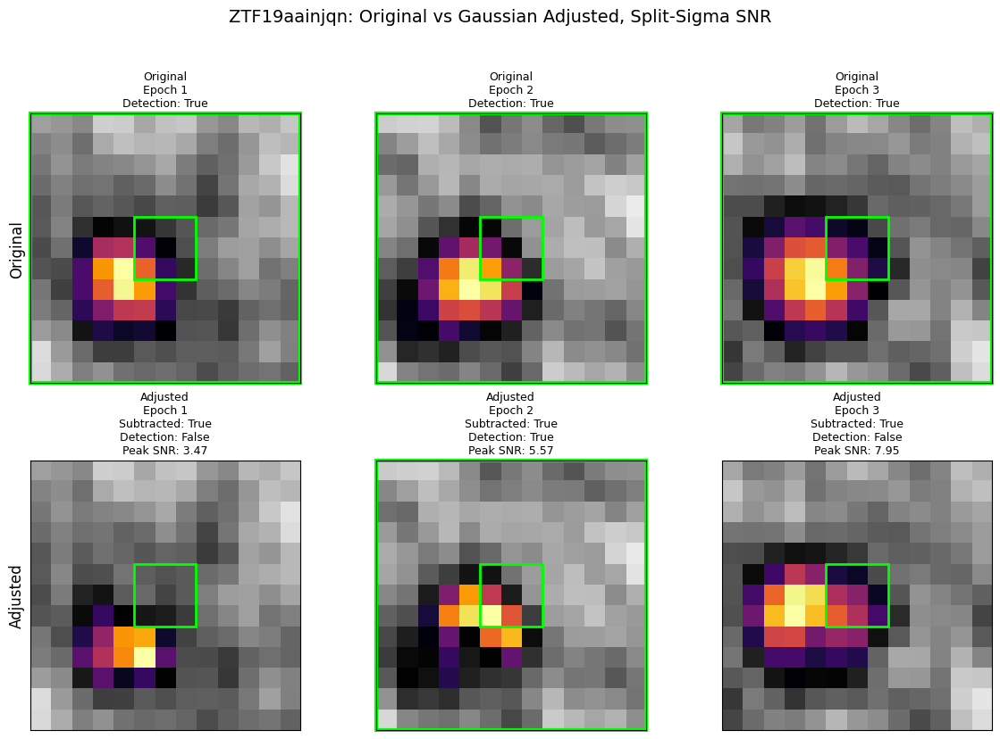

In [15]:
plot_original_vs_adjusted_13x13_split_sigma(
    detected_df,
    object_name="ZTF19aainjqn",
    threshold=4
)

In [16]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle


def view_new_detected_objects_split_sigma(
    detected_df,
    name_col="Name",
    epoch_col="Epoch",
    path_col="Gaussian Adjusted File Path",
    fallback_path_col="File Path",
    rms_col="New RMS",
    max_lum_col="New Peak 3x3",
    detection_col="New Detection",
    dt_col="Rest_DeltaT",
    threshold=4,
    include_legacy=True,
    legacy_dir="legacy_cutouts"
):
    """
    View all objects in detected_df that have at least one New Detection == True.

    Uses split-sigma visualization:
      - below threshold shown in grayscale
      - above threshold shown in inferno
      - green border if that epoch is detected

    By default, plots:
      - Gaussian Adjusted File Path arrays
      - New RMS
      - New Peak 3x3
      - New Detection
    """

    # Keep only objects where any epoch has a new detection
    detected_names = (
        detected_df.groupby(name_col)[detection_col]
        .any()
    )

    detected_names = detected_names[detected_names].index.tolist()

    df = detected_df[
        detected_df[name_col].isin(detected_names)
    ].copy()

    if len(df) == 0:
        print("No objects with new detections found.")
        return

    df = df.sort_values([name_col, epoch_col])
    object_names = df[name_col].unique()

    ncols = 4 if include_legacy else 3
    nrows = len(object_names)

    fig, axes = plt.subplots(
        nrows,
        ncols,
        figsize=(10, 2.8 * nrows) if include_legacy else (8, 2.8 * nrows),
        gridspec_kw={
            "width_ratios": [1, 1, 1, 1.6]
        } if include_legacy else None,
        squeeze=False
    )

    for i, obj in enumerate(object_names):
        obj_df = df[df[name_col] == obj]

        # Epochs 1–3
        for j, epoch in enumerate([1, 2, 3]):
            ax = axes[i, j]

            row = obj_df[obj_df[epoch_col] == epoch]

            if row.empty:
                ax.axis("off")
                continue

            row = row.iloc[0]

            # Load adjusted array if it exists, otherwise fall back to original
            path = row.get(path_col, None)

            if isinstance(path, str) and os.path.exists(path):
                arr = np.load(path)
            else:
                fallback_path = row.get(fallback_path_col, None)

                if isinstance(fallback_path, str) and os.path.exists(fallback_path):
                    arr = np.load(fallback_path)
                else:
                    ax.set_title(f"{obj}\nEpoch {epoch}\nNo file", fontsize=9)
                    ax.axis("off")
                    continue

            rms = row.get(rms_col, np.nan)

            if not np.isfinite(rms) or rms <= 0:
                ax.set_title(f"{obj}\nEpoch {epoch}\nBad RMS", fontsize=9)
                ax.axis("off")
                continue

            snr = arr / rms

            peak_lum = row.get(max_lum_col, np.nan)

            if np.isfinite(peak_lum):
                snr_value = peak_lum / rms
            else:
                snr_value = np.nan

            detected = bool(row.get(detection_col, False))

            # Split into below-threshold and above-threshold layers
            below = np.ma.masked_where(snr >= threshold, snr)
            above = np.ma.masked_where(snr < threshold, snr)

            # Below threshold: grayscale
            ax.imshow(
                below,
                origin="lower",
                cmap="Greys",
                aspect="equal",
                vmin=-3,
                vmax=threshold
            )

            # Above threshold: highlighted
            above_vmax = max(threshold + 1, np.nanmax(snr))

            ax.imshow(
                above,
                origin="lower",
                cmap="inferno",
                aspect="equal",
                vmin=threshold,
                vmax=above_vmax
            )

            # Central 3x3 box
            ny, nx = arr.shape
            cy, cx = ny // 2, nx // 2

            ax.add_patch(
                Rectangle(
                    (cx - 1.5, cy - 1.5),
                    3,
                    3,
                    fill=False,
                    edgecolor="lime",
                    linewidth=1.5
                )
            )

            title = f"{obj}\nEpoch {epoch}"

            if dt_col in row and np.isfinite(row[dt_col]):
                title += f"\ndt={row[dt_col]:.0f}"

            if np.isfinite(snr_value):
                title += f"\nSNR={snr_value:.2f}"

            ax.set_title(title, fontsize=9)
            ax.axis("off")

            # Green border if this epoch is newly detected
            if detected:
                ax.add_patch(
                    Rectangle(
                        (0, 0), 1, 1,
                        transform=ax.transAxes,
                        fill=False,
                        edgecolor="lime",
                        linewidth=3,
                        clip_on=False
                    )
                )

        # Legacy cutout column
        if include_legacy:
            ax = axes[i, 3]
            legacy_path = os.path.join(legacy_dir, f"{obj}_legsurv.png")

            if os.path.exists(legacy_path):
                img = plt.imread(legacy_path)
                ax.imshow(img, aspect="equal")
                ax.set_title(f"{obj}\nLegacy", fontsize=9)
            else:
                ax.set_title("No LS", fontsize=9)

            ax.axis("off")

    fig.suptitle(
        f"Objects with New Detection ≥ {threshold}σ",
        fontsize=14,
        y=1.002
    )

    plt.tight_layout()
    plt.show()

    print(f"Number of objects with new detections: {len(object_names)}")

In [21]:
detected_df.groupby("Name")["New Detection"].any().sum()

np.int64(220)

In [28]:
detected_df

,Name,Epoch,RA,Dec,type,redshift,Distance_Mpc,Rest_DeltaT,Peak Luminosity,RMS,Flux_mjy,RMS_mjy,File Path,fits_path,center_lum,Detection
0,ZTF17aaazdba,1,08:13:16.95,+22:38:53.9,TDE,0.02200,94.285714,49.882583,5.020735e+27,2.043337e+27,0.472018,0.192104,final_luminosity_arrays\ZTF17aaazdba_epoch_1_l...,dillon_extracting_files\dillon_fits\ztf_cutout...,1.246972e+27,False
1,ZTF17aaazdba,2,08:13:16.95,+22:38:53.9,TDE,0.02200,94.285714,1002.915851,1.173864e+28,1.394146e+27,1.103592,0.131071,final_luminosity_arrays\ZTF17aaazdba_epoch_2_l...,dillon_extracting_files\dillon_fits\ztf_cutout...,1.023555e+28,True
2,ZTF17aaazdba,3,08:13:16.95,+22:38:53.9,TDE,0.02200,94.285714,1857.123288,7.425113e+27,1.390637e+27,0.698062,0.130741,final_luminosity_arrays\ZTF17aaazdba_epoch_3_l...,dillon_extracting_files\dillon_fits\ztf_cutout...,7.425113e+27,True
3,ZTF18aadmssd,1,06:50:25.81,+43:03:11.6,SN IIn,0.01885,80.785714,100.691957,3.945697e+28,1.183126e+27,5.052860,0.151513,final_luminosity_arrays\ZTF18aadmssd_epoch_1_l...,dillon_extracting_files\dillon_fits\ztf_cutout...,3.945697e+28,True
4,ZTF18aadmssd,2,06:50:25.81,+43:03:11.6,SN IIn,0.01885,80.785714,980.114835,4.479759e+28,9.766168e+26,5.736781,0.125067,final_luminosity_arrays\ZTF18aadmssd_epoch_2_l...,dillon_extracting_files\dillon_fits\ztf_cutout...,4.479759e+28,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
863,ZTF24abgvscf,2,07:57:32.02,+59:05:07.9,SN Ia,0.01894,81.171429,NaN,2.108735e+28,1.434099e+27,2.674843,0.181912,final_luminosity_arrays\ZTF24abgvscf_epoch_2_l...,dillon_extracting_files\dillon_fits\ztf_cutout...,9.337898e+27,True
864,ZTF24abgvscf,3,07:57:32.02,+59:05:07.9,SN Ia,0.01894,81.171429,-570.645750,1.924552e+28,1.275106e+27,2.441215,0.161744,final_luminosity_arrays\ZTF24abgvscf_epoch_3_l...,dillon_extracting_files\dillon_fits\ztf_cutout...,1.284620e+28,True
865,ZTF24abiktwr,1,00:09:11.75,-00:36:50.8,SN Ia,0.07200,308.571429,-2307.179251,3.575738e+29,1.574173e+28,3.138608,0.138175,final_luminosity_arrays\ZTF24abiktwr_epoch_1_l...,dillon_extracting_files\dillon_fits\ztf_cutout...,2.576797e+28,True
866,ZTF24abiktwr,2,00:09:11.75,-00:36:50.8,SN Ia,0.07200,308.571429,-1425.649401,2.768099e+29,2.049191e+28,2.429702,0.179871,final_luminosity_arrays\ZTF24abiktwr_epoch_2_l...,dillon_extracting_files\dillon_fits\ztf_cutout...,6.938510e+28,True


In [17]:
view_new_detected_objects_split_sigma(detected_df)

Number of objects with new detections: 220


-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

----------------------------

In [ ]:
def central_3x3_mask(arr):
    """
    Return a boolean mask for the central 3x3 region.
    """
    ny, nx = arr.shape
    cy, cx = ny // 2, nx // 2

    mask = np.zeros(arr.shape, dtype=bool)
    mask[cy-1:cy+2, cx-1:cx+2] = True

    return mask

In [ ]:
def gaussian_fixed_center(coords, amp, sigma_x, sigma_y, offset, bright_x, bright_y):
    """
    2D Gaussian with fixed center.
    """
    x, y = coords

    model = (
        amp * np.exp(
            -(
                ((x - bright_x) ** 2) / (2 * sigma_x ** 2)
                + ((y - bright_y) ** 2) / (2 * sigma_y ** 2)
            )
        )
        + offset
    )

    return model.ravel()

### Step 1 

In [4]:
def step1_find_brightest_pixel(arr):
    """
    Step 1:
    - Find the central 3x3 region
    - Find the brightest pixel in the whole image
    - Check whether that brightest pixel is inside the central 3x3
    """

    # Central 3x3 mask
    ny, nx = arr.shape
    cy, cx = ny // 2, nx // 2

    central_mask = np.zeros(arr.shape, dtype=bool)
    central_mask[cy-1:cy+2, cx-1:cx+2] = True

    # Brightest pixel in the whole image
    brightest_index = np.nanargmax(arr)
    bright_y, bright_x = np.unravel_index(brightest_index, arr.shape)

    brightest_value = arr[bright_y, bright_x]

    # Is brightest pixel in central 3x3?
    brightest_in_center = central_mask[bright_y, bright_x]

    return {
        "central_mask": central_mask,
        "bright_y": bright_y,
        "bright_x": bright_x,
        "brightest_value": brightest_value,
        "brightest_in_center": brightest_in_center
    }

In [5]:
from scipy.optimize import curve_fit
import numpy as np

def step2_fit_gaussian(arr, step1, fit_radius=3):
    bright_y = step1["bright_y"]
    bright_x = step1["bright_x"]

    y_grid, x_grid = np.indices(arr.shape)

    central_mask = step1["central_mask"]

    fit_mask = (
        (np.abs(x_grid - bright_x) <= fit_radius)
        & (np.abs(y_grid - bright_y) <= fit_radius)
        & np.isfinite(arr)
        & (~central_mask)
    )

    x_fit = x_grid[fit_mask]
    y_fit = y_grid[fit_mask]
    z_fit = arr[fit_mask]

    print("Number of pixels used in fit:", len(z_fit))

    def gaussian_fixed_center(coords, amp, sigma_x, sigma_y, offset):
        x, y = coords

        model = (
            amp * np.exp(
                -(
                    ((x - bright_x) ** 2) / (2 * sigma_x ** 2)
                    + ((y - bright_y) ** 2) / (2 * sigma_y ** 2)
                )
            )
            + offset
        )

        return model.ravel()

    amp_guess = np.nanmax(z_fit) - np.nanmedian(z_fit)
    sigma_x_guess = 1.5
    sigma_y_guess = 1.5
    offset_guess = np.nanmedian(z_fit)

    p0 = [amp_guess, sigma_x_guess, sigma_y_guess, offset_guess]

    bounds = (
        [0, 0.5, 0.5, -np.inf],
        [np.inf, 5.0, 5.0, np.inf]
    )

    popt, pcov = curve_fit(
        gaussian_fixed_center,
        (x_fit, y_fit),
        z_fit,
        p0=p0,
        bounds=bounds,
        maxfev=10000
    )

    amp, sigma_x, sigma_y, offset = popt

    model = gaussian_fixed_center(
        (x_grid, y_grid),
        amp,
        sigma_x,
        sigma_y,
        offset
    ).reshape(arr.shape)

    return {
        "amp": amp,
        "sigma_x": sigma_x,
        "sigma_y": sigma_y,
        "offset": offset,
        "model": model,
        "fit_mask": fit_mask,
        "fit_radius": fit_radius
    }

In [6]:
def step3_make_residual(arr, step2):
    """
    Step 3:
    - If no Gaussian was fit, residual is just the original image.
    - If Gaussian was fit, subtract the model.
    """

    arr = np.asarray(arr, dtype=float)

    if step2 is None:
        residual = arr.copy()
        did_subtract = False
    else:
        residual = arr - step2["model"]
        did_subtract = True

    return {
        "residual": residual,
        "did_subtract": did_subtract
    }

In [7]:
step1 = step1_find_brightest_pixel(arr)

if step1["brightest_in_center"]:
    print("Brightest pixel is central. No contaminant subtraction attempted.")
else:
    print("Brightest pixel is outside center. Attempting Gaussian contaminant fit.")

step2 = step2_fit_gaussian(arr, step1, fit_radius=3)

step3 = step3_make_residual(arr, step2)

residual = step3["residual"]

print("Did subtract contaminant?", step3["did_subtract"])

Brightest pixel is outside center. Attempting Gaussian contaminant fit.
Number of pixels used in fit: 40
Did subtract contaminant? True


### Plotting Code

In [14]:
from matplotlib.patches import Rectangle

def plot_steps_1_to_3(arr, step1, step2, step3):
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    im0 = axes[0].imshow(arr, origin="lower", cmap="inferno")
    axes[0].set_title("Original")
    plt.colorbar(im0, ax=axes[0], fraction=0.046)

    if step2 is not None:
        model = step2["model"]
    else:
        model = np.zeros_like(arr)

    im1 = axes[1].imshow(model, origin="lower", cmap="inferno")
    axes[1].set_title("Gaussian Model")
    plt.colorbar(im1, ax=axes[1], fraction=0.046)

    im2 = axes[2].imshow(step3["residual"], origin="lower", cmap="inferno")
    axes[2].set_title("Residual")
    plt.colorbar(im2, ax=axes[2], fraction=0.046)

    ny, nx = arr.shape
    cy, cx = ny // 2, nx // 2

    for ax in axes:
        central_box = Rectangle(
            (cx - 1.5, cy - 1.5),
            3,
            3,
            fill=False,
            edgecolor="cyan",
            linewidth=2
        )
        ax.add_patch(central_box)

        ax.scatter(
            step1["bright_x"],
            step1["bright_y"],
            marker="x",
            s=100,
            color="lime"
        )

    plt.tight_layout()
    plt.show()

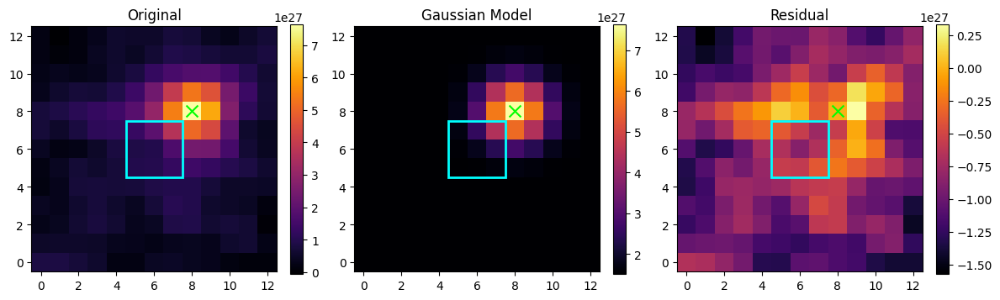

In [15]:
plot_steps_1_to_3(arr, step1, step2, step3)

### New Code

In [8]:
def central_3x3_mask(arr):
    """
    Boolean mask for central 3x3 pixels.
    """
    ny, nx = arr.shape
    cy, cx = ny // 2, nx // 2

    mask = np.zeros(arr.shape, dtype=bool)
    mask[cy-1:cy+2, cx-1:cx+2] = True

    return mask


def central_3x3_peak(arr):
    """
    Maximum value in the central 3x3 region.
    """
    mask = central_3x3_mask(arr)
    return np.nanmax(arr[mask])


def calculate_rms(arr, sig_value=4, n_iter=4, exclude_center=True):
    """
    Sigma-clipped RMS calculation.

    By default, excludes the central 3x3 region so that a real source
    in the center does not inflate the RMS.
    """
    arr = np.asarray(arr, dtype=float)

    finite_mask = np.isfinite(arr)

    if exclude_center:
        center_mask = central_3x3_mask(arr)
        mask = finite_mask & (~center_mask)
    else:
        mask = finite_mask.copy()

    for _ in range(n_iter):
        data = arr[mask]

        if len(data) == 0:
            return np.nan

        median = np.nanmedian(data)
        std = np.nanstd(data)

        if std == 0 or not np.isfinite(std):
            return np.nan

        if exclude_center:
            mask = (
                finite_mask
                & (~center_mask)
                & (np.abs(arr - median) <= sig_value * std)
            )
        else:
            mask = (
                finite_mask
                & (np.abs(arr - median) <= sig_value * std)
            )

    return np.nanstd(arr[mask])

In [9]:
def subtract_bright_contaminant(
    arr,
    fit_radius=3,
    min_fit_pixels=8,
    sigma_guess=1.5,
    sigma_bounds=(0.5, 5.0),
    verbose=False
):
    """
    Subtract a bright off-center contaminant using a fixed-center 2D Gaussian.

    If the brightest pixel is inside the central 3x3, no subtraction is done.
    """

    arr = np.asarray(arr, dtype=float)

    central_mask = central_3x3_mask(arr)
    y_grid, x_grid = np.indices(arr.shape)

    brightest_index = np.nanargmax(arr)
    bright_y, bright_x = np.unravel_index(brightest_index, arr.shape)
    brightest_value = arr[bright_y, bright_x]

    brightest_in_center = central_mask[bright_y, bright_x]

    result = {
        "cleaned_arr": arr.copy(),
        "model": None,
        "did_subtract": False,
        "fit_success": False,
        "fit_error": None,
        "bright_y": bright_y,
        "bright_x": bright_x,
        "brightest_value": brightest_value,
        "brightest_in_center": brightest_in_center,
        "fit_mask": None,
        "amp": np.nan,
        "sigma_x": np.nan,
        "sigma_y": np.nan,
        "offset": np.nan,
    }

    if brightest_in_center:
        if verbose:
            print("Brightest pixel is central. No subtraction.")
        return result

    if verbose:
        print("Brightest pixel is outside center. Fitting contaminant.")

    fit_mask = (
        (np.abs(x_grid - bright_x) <= fit_radius)
        & (np.abs(y_grid - bright_y) <= fit_radius)
        & np.isfinite(arr)
        & (~central_mask)
    )

    result["fit_mask"] = fit_mask

    x_fit = x_grid[fit_mask]
    y_fit = y_grid[fit_mask]
    z_fit = arr[fit_mask]

    if len(z_fit) < min_fit_pixels:
        result["fit_error"] = f"Not enough pixels for fit: {len(z_fit)}"
        return result

    def gaussian_fixed_center(coords, amp, sigma_x, sigma_y, offset):
        x, y = coords

        model = (
            amp * np.exp(
                -(
                    ((x - bright_x) ** 2) / (2 * sigma_x ** 2)
                    + ((y - bright_y) ** 2) / (2 * sigma_y ** 2)
                )
            )
            + offset
        )

        return model.ravel()

    amp_guess = np.nanmax(z_fit) - np.nanmedian(z_fit)
    offset_guess = np.nanmedian(z_fit)

    p0 = [
        amp_guess,
        sigma_guess,
        sigma_guess,
        offset_guess
    ]

    bounds = (
        [0, sigma_bounds[0], sigma_bounds[0], -np.inf],
        [np.inf, sigma_bounds[1], sigma_bounds[1], np.inf]
    )

    try:
        popt, pcov = curve_fit(
            gaussian_fixed_center,
            (x_fit, y_fit),
            z_fit,
            p0=p0,
            bounds=bounds,
            maxfev=10000
        )

        amp, sigma_x, sigma_y, offset = popt

        model = gaussian_fixed_center(
            (x_grid, y_grid),
            amp,
            sigma_x,
            sigma_y,
            offset
        ).reshape(arr.shape)

        cleaned_arr = arr - model

        result.update({
            "cleaned_arr": cleaned_arr,
            "model": model,
            "did_subtract": True,
            "fit_success": True,
            "amp": amp,
            "sigma_x": sigma_x,
            "sigma_y": sigma_y,
            "offset": offset,
        })

    except Exception as e:
        result["fit_error"] = str(e)

    return result

In [13]:
pd.read_csv('detected_newrms.csv')

,0
0,ZTF17aaazdba
1,ZTF18aadmssd
2,ZTF18aaemivw
3,ZTF18aaermez
4,ZTF18aamzgzi
...,...
95,ZTF23abbccir
96,ZTF23abjexnw
97,ZTF23abnqbkx
98,ZTF23abtnhva
